# Heart Attack Prediction Analysis with Health and Lifestyle Data
#### Exploring the Critical Factors Behind Heart Attack Risks

In the realm of healthcare and wellness, understanding the underlying factors that contribute to heart attacks is paramount for both prevention and early diagnosis. This project leverages a comprehensive dataset to analyze various health and lifestyle indicators that may influence the likelihood of heart attacks, focusing on crucial metrics like age, cholesterol levels, blood pressure, smoking habits, and other key variables.

The dataset, includes 372,974 rows and 32 columns, capturing a wide range of factors that contribute to heart attack risks. The goal is to uncover patterns and correlations between these variables and heart attack occurrences, with the intention of promoting better heart health awareness and prevention strategies.

Our analysis pipeline includes thorough Exploratory Data Analysis (EDA), advanced feature engineering (including handling of missing values and encoding), and the application of classification models such as Logistic Regression, Random Forest, and Decision Tree classifier to predict the likelihood of heart attacks based on the dataset's health and lifestyle factors.

Through this project, we aim to provide valuable insights that can assist healthcare professionals and organizations in understanding the risk factors of heart attacks, thereby fostering more informed decisions for heart health management and ultimately saving lives.

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings('ignore')

In [8]:
#!pip install opendatasets

In [9]:
import opendatasets as od

In [9]:
od.download("https://www.kaggle.com/datasets/ankushpanday2/heart-attack-prediction-in-united-states")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

  ameyapravinsurve


Your Kaggle Key:

  ········


Dataset URL: https://www.kaggle.com/datasets/ankushpanday2/heart-attack-prediction-in-united-states


100%|█████████████████████████████████████████████████████████████████████████████| 12.0M/12.0M [00:03<00:00, 4.05MB/s]


In [13]:
df=pd.read_csv("heart_attack_dataset.csv")
df

,Age,Gender,Cholesterol,BloodPressure,HeartRate,BMI,Smoker,Diabetes,Hypertension,FamilyHistory,...,ExerciseInducedAngina,Slope,NumberOfMajorVessels,Thalassemia,PreviousHeartAttack,StrokeHistory,Residence,EmploymentStatus,MaritalStatus,Outcome
0,31,Male,194,162,71,22.9,0,1,0,0,...,Yes,Downsloping,1,Normal,0,0,Suburban,Retired,Single,No Heart Attack
1,69,Male,208,148,93,33.9,1,1,0,0,...,Yes,Upsloping,2,Normal,0,0,Suburban,Unemployed,Married,No Heart Attack
2,34,Female,132,161,94,34.0,0,0,1,1,...,Yes,Upsloping,0,Normal,1,0,Rural,Retired,Single,Heart Attack
3,53,Male,268,134,91,35.0,0,1,1,0,...,Yes,Flat,0,Reversible defect,1,0,Suburban,Retired,Widowed,No Heart Attack
4,57,Female,203,140,75,30.1,0,1,0,0,...,Yes,Flat,0,Fixed defect,1,0,Rural,Retired,Married,Heart Attack
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372969,49,Female,285,131,79,27.6,0,1,1,1,...,Yes,Flat,2,Fixed defect,1,0,Urban,Employed,Married,No Heart Attack
372970,77,Male,197,159,64,33.5,0,1,0,1,...,No,Downsloping,3,Fixed defect,0,1,Urban,Employed,Married,Heart Attack
372971,53,Female,243,94,84,34.7,1,1,1,0,...,Yes,Flat,3,Reversible defect,1,1,Urban,Retired,Married,Heart Attack
372972,78,Female,291,93,78,29.3,1,1,0,1,...,Yes,Upsloping,1,Fixed defect,0,0,Urban,Employed,Married,No Heart Attack


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 372974 entries, 0 to 372973
Data columns (total 32 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Age                    372974 non-null  int64  
 1   Gender                 372974 non-null  object 
 2   Cholesterol            372974 non-null  int64  
 3   BloodPressure          372974 non-null  int64  
 4   HeartRate              372974 non-null  int64  
 5   BMI                    372974 non-null  float64
 6   Smoker                 372974 non-null  int64  
 7   Diabetes               372974 non-null  int64  
 8   Hypertension           372974 non-null  int64  
 9   FamilyHistory          372974 non-null  int64  
 10  PhysicalActivity       372974 non-null  int64  
 11  AlcoholConsumption     372974 non-null  int64  
 12  Diet                   372974 non-null  object 
 13  StressLevel            372974 non-null  int64  
 14  Ethnicity              372974 non-nu

In [15]:
df.isna().sum()

Age                      0
Gender                   0
Cholesterol              0
BloodPressure            0
HeartRate                0
BMI                      0
Smoker                   0
Diabetes                 0
Hypertension             0
FamilyHistory            0
PhysicalActivity         0
AlcoholConsumption       0
Diet                     0
StressLevel              0
Ethnicity                0
Income                   0
EducationLevel           0
Medication               0
ChestPainType            0
ECGResults               0
MaxHeartRate             0
ST_Depression            0
ExerciseInducedAngina    0
Slope                    0
NumberOfMajorVessels     0
Thalassemia              0
PreviousHeartAttack      0
StrokeHistory            0
Residence                0
EmploymentStatus         0
MaritalStatus            0
Outcome                  0
dtype: int64

In [16]:
df.duplicated().sum()

0

##### Note: There are no null or duplicate entries in our dataset, thus there is at this moment, no requirement of dropping or manipulating any entries.

In [22]:
numeric_cols = df.select_dtypes(include=['number']).columns
print("Numeric columns:", numeric_cols.tolist())

Numeric columns: ['Age', 'Cholesterol', 'BloodPressure', 'HeartRate', 'BMI', 'Smoker', 'Diabetes', 'Hypertension', 'FamilyHistory', 'PhysicalActivity', 'AlcoholConsumption', 'StressLevel', 'Income', 'MaxHeartRate', 'ST_Depression', 'NumberOfMajorVessels', 'PreviousHeartAttack', 'StrokeHistory']


In [24]:
from sklearn.preprocessing import LabelEncoder
label_encoders = {}
d = LabelEncoder()
df['Outcome'] = d.fit_transform(df['Outcome'].astype(str))
df

,Age,Gender,Cholesterol,BloodPressure,HeartRate,BMI,Smoker,Diabetes,Hypertension,FamilyHistory,...,ExerciseInducedAngina,Slope,NumberOfMajorVessels,Thalassemia,PreviousHeartAttack,StrokeHistory,Residence,EmploymentStatus,MaritalStatus,Outcome
0,31,Male,194,162,71,22.9,0,1,0,0,...,Yes,Downsloping,1,Normal,0,0,Suburban,Retired,Single,1
1,69,Male,208,148,93,33.9,1,1,0,0,...,Yes,Upsloping,2,Normal,0,0,Suburban,Unemployed,Married,1
2,34,Female,132,161,94,34.0,0,0,1,1,...,Yes,Upsloping,0,Normal,1,0,Rural,Retired,Single,0
3,53,Male,268,134,91,35.0,0,1,1,0,...,Yes,Flat,0,Reversible defect,1,0,Suburban,Retired,Widowed,1
4,57,Female,203,140,75,30.1,0,1,0,0,...,Yes,Flat,0,Fixed defect,1,0,Rural,Retired,Married,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372969,49,Female,285,131,79,27.6,0,1,1,1,...,Yes,Flat,2,Fixed defect,1,0,Urban,Employed,Married,1
372970,77,Male,197,159,64,33.5,0,1,0,1,...,No,Downsloping,3,Fixed defect,0,1,Urban,Employed,Married,0
372971,53,Female,243,94,84,34.7,1,1,1,0,...,Yes,Flat,3,Reversible defect,1,1,Urban,Retired,Married,0
372972,78,Female,291,93,78,29.3,1,1,0,1,...,Yes,Upsloping,1,Fixed defect,0,0,Urban,Employed,Married,1


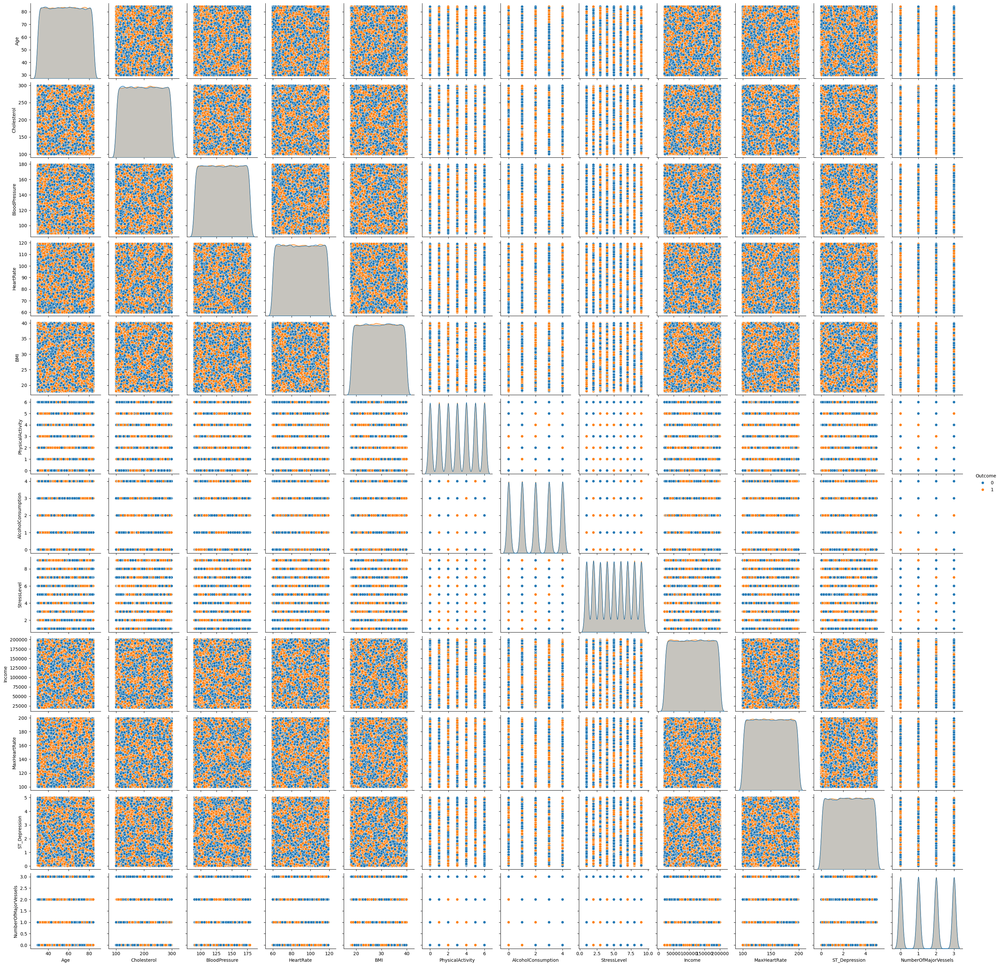

In [23]:
#'Smoker', 'Diabetes', 'Hypertension', 'FamilyHistory', 'PreviousHeartAttack', 'StrokeHistory'
columns = ['Age', 'Cholesterol', 'BloodPressure', 'HeartRate', 'BMI', 'PhysicalActivity', 'AlcoholConsumption', 'StressLevel', 'Income', 'MaxHeartRate', 'ST_Depression', 'NumberOfMajorVessels']
sns.pairplot(df[columns+['Outcome']], hue="Outcome")  
plt.show()

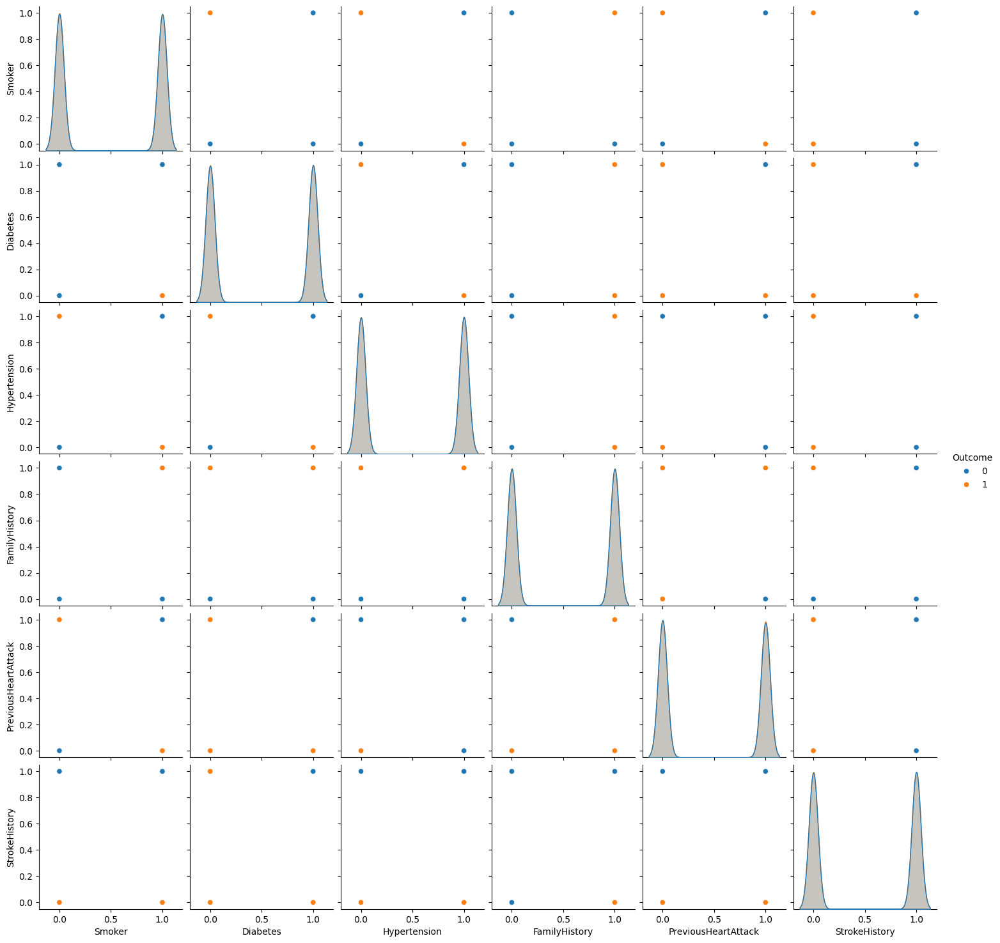

In [282]:
columns = ['Smoker', 'Diabetes', 'Hypertension', 'FamilyHistory', 'PreviousHeartAttack', 'StrokeHistory']
sns.pairplot(df[columns+['Outcome']], hue="Outcome")  
plt.show()

### Pair Plot Analysis – Feature Relationships & Class Distribution

The pair plots shown above display the bivariate distributions and class-wise scatter patterns between all the numerical and encoded categorical variables in the dataset, with hue set to `Outcome` (0 = No Heart Attack, 1 = Heart Attack).

#### Observations & Inferences:

1. **No Strong Linear Relationships Between Most Features**:
   - There is no clear linear correlation between most variables, indicating that complex or non-linear models may be more suitable than simple regression-based classifiers.

2. **Overlapping Distributions**:
   - Many features such as `Age`, `Cholesterol`, `BloodPressure`, and `HeartRate` have overlapping data points for both classes (0 and 1), which suggests that no single feature is sufficient for classification.
   - This emphasizes the need for multi-feature interaction for accurate prediction.

3. **Feature Clusters & Separation**:
   - Some categorical features like `PreviousHeartAttack`, and `StrokeHistory` show **slightly better class separation** (i.e., more orange dots where Outcome = 1), implying their importance in determining risk.
   - This is especially visible in the lower part of the second pairplot image.

4. **Sparse or Discrete Variable Distribution**:
   - Binary or categorical columns such as `Smoker`, `Diabetes`, `Hypertension`, `AlcoholConsumption`, etc., form discrete bands, which makes them easy to separate during tree-based splits or encoding.

#### Takeaway:
- There are **no strong, visually obvious separations** between classes in most features, indicating the problem is **complex and non-trivial**.
- Feature engineering and model tuning (e.g., ensemble methods or boosting techniques) will be critical to improve performance.
- Despite overlaps, features like **PreviousHeartAttack**, and **StrokeHistory** appear more indicative of risk.

These insights help us prioritize which features might carry more weight and confirm that **multi-variate classification models** are the right approach.



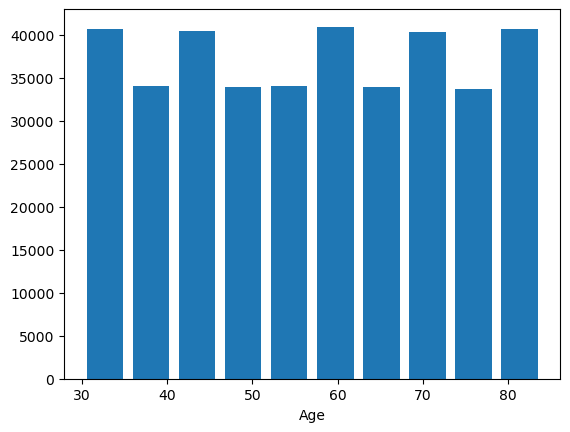

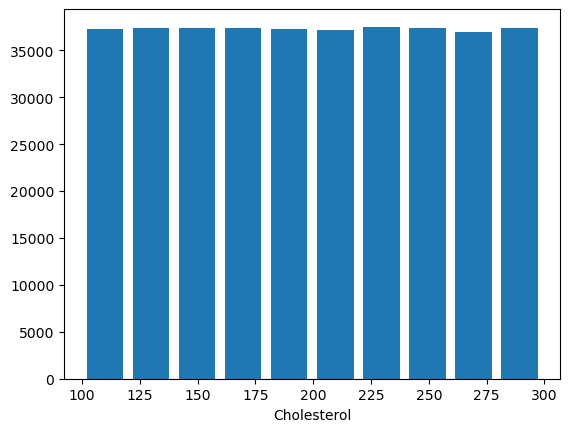

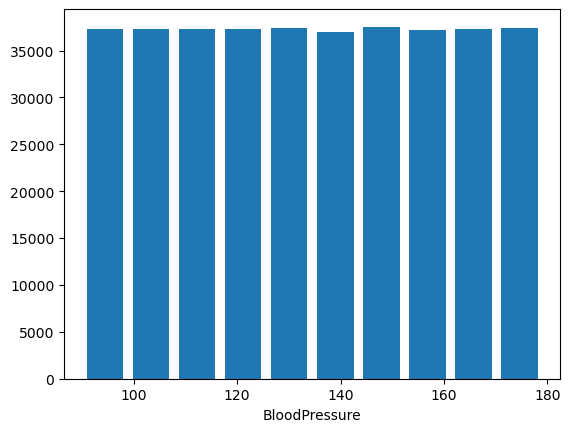

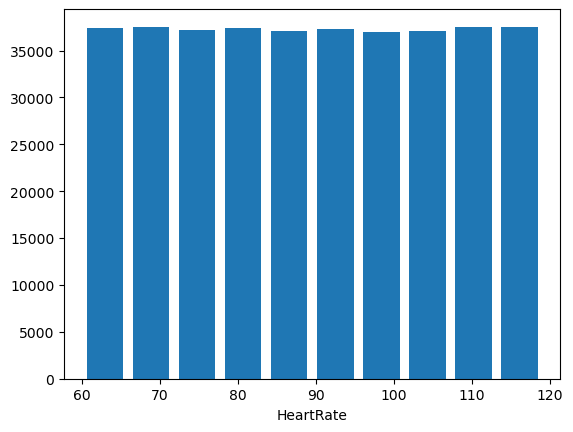

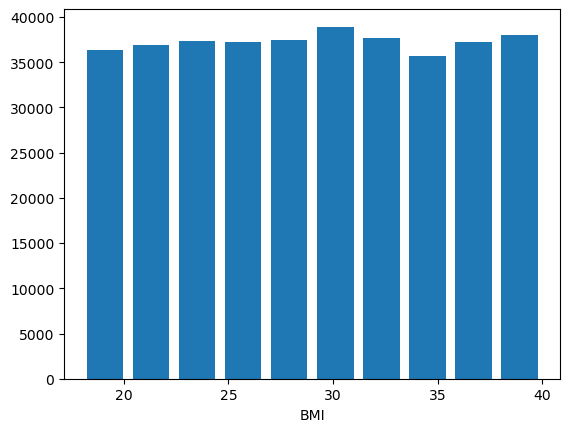

...

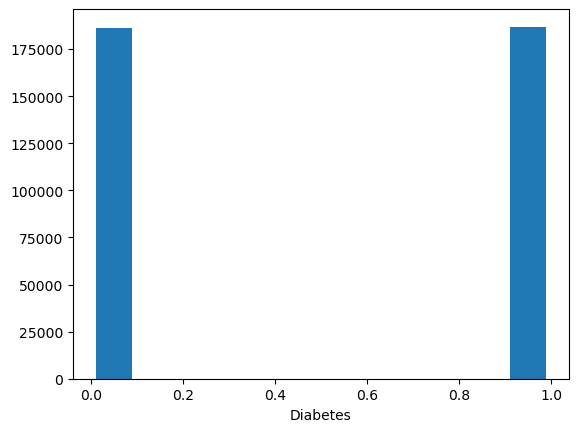

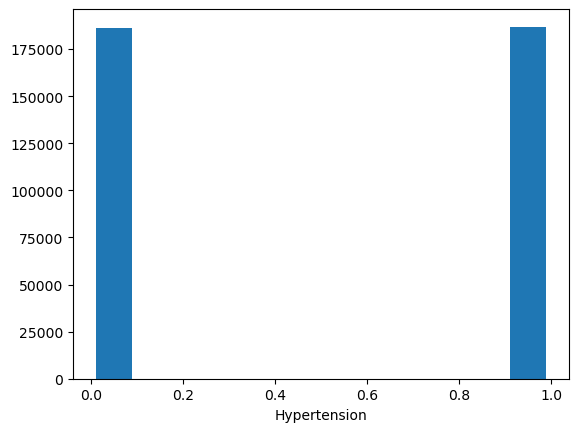

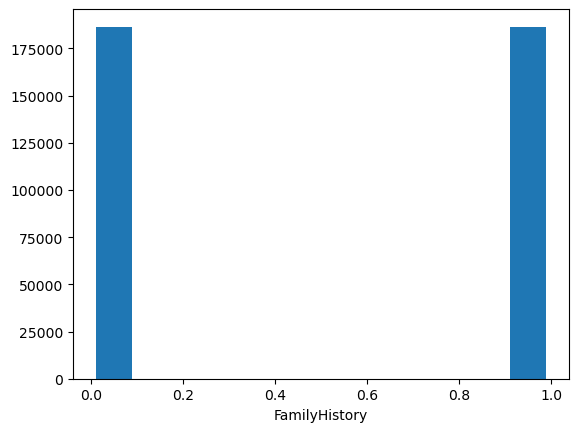

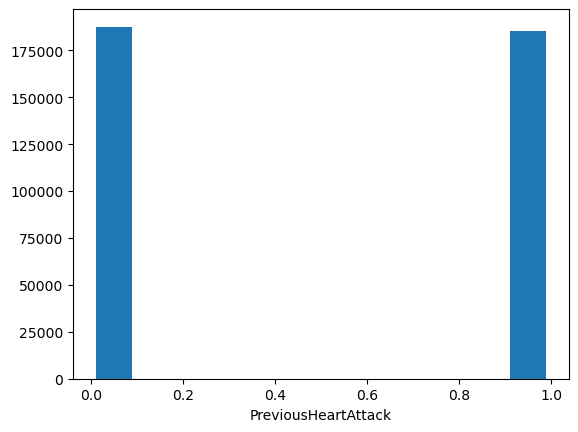

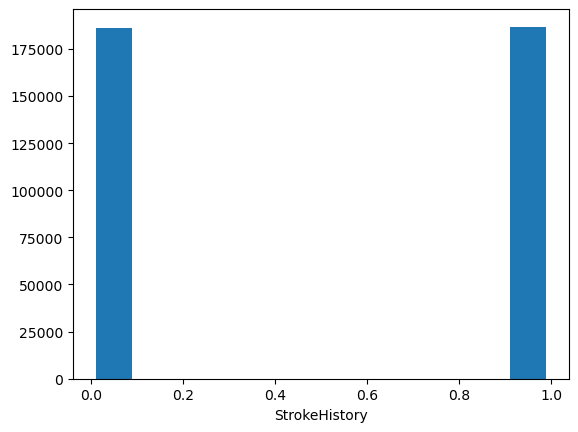

In [28]:
columns = ['Age', 'Cholesterol', 'BloodPressure', 'HeartRate', 'BMI', 'PhysicalActivity', 'AlcoholConsumption', 'StressLevel', 'Income', 'MaxHeartRate', 'ST_Depression', 'NumberOfMajorVessels','Smoker', 'Diabetes', 'Hypertension', 'FamilyHistory', 'PreviousHeartAttack', 'StrokeHistory']
for column in columns:
    plt.xlabel(column)
    plt.hist(df[column], rwidth=0.8)
    plt.show()

### **Overall Insights from Categorical Feature Distributions (Cell 28)**

The bar graphs collectively highlight that individuals with heart disease (Outcome = 1) tend to have **higher proportions** across several health risk indicators, including:

- **Diabetes**
- **Previous heart attack**
- **Stroke history**

These categorical features appear more prevalent among those with heart disease, suggesting that **multiple comorbid conditions** and **lifestyle-related factors** are contributing to the risk.

While none of these features alone show perfect separation between the classes, their combined effect likely plays a significant role — supporting the use of **multi-feature**, possibly **non-linear classifiers** for prediction.

In [26]:
from sklearn.preprocessing import LabelEncoder
label_encoders = {}
lists=['Gender','Diet','Ethnicity','EducationLevel','Medication','ChestPainType','ECGResults','ExerciseInducedAngina','Slope','Thalassemia','Residence','EmploymentStatus','MaritalStatus','Outcome']
for k in lists:
    d = LabelEncoder()
    df[k] = d.fit_transform(df[k].astype(str))
    label_encoders[k] = d
df

,Age,Gender,Cholesterol,BloodPressure,HeartRate,BMI,Smoker,Diabetes,Hypertension,FamilyHistory,...,ExerciseInducedAngina,Slope,NumberOfMajorVessels,Thalassemia,PreviousHeartAttack,StrokeHistory,Residence,EmploymentStatus,MaritalStatus,Outcome
0,31,1,194,162,71,22.9,0,1,0,0,...,1,0,1,1,0,0,1,1,2,1
1,69,1,208,148,93,33.9,1,1,0,0,...,1,2,2,1,0,0,1,2,1,1
2,34,0,132,161,94,34.0,0,0,1,1,...,1,2,0,1,1,0,0,1,2,0
3,53,1,268,134,91,35.0,0,1,1,0,...,1,1,0,2,1,0,1,1,3,1
4,57,0,203,140,75,30.1,0,1,0,0,...,1,1,0,0,1,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372969,49,0,285,131,79,27.6,0,1,1,1,...,1,1,2,0,1,0,2,0,1,1
372970,77,1,197,159,64,33.5,0,1,0,1,...,0,0,3,0,0,1,2,0,1,0
372971,53,0,243,94,84,34.7,1,1,1,0,...,1,1,3,2,1,1,2,1,1,0
372972,78,0,291,93,78,29.3,1,1,0,1,...,1,2,1,0,0,0,2,0,1,1


<Axes: >

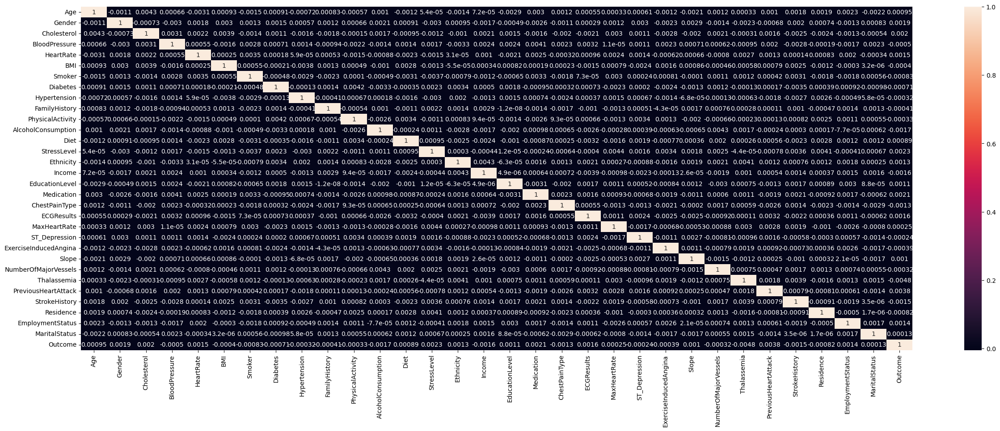

In [48]:
plt.figure(figsize=(30,10))
sns.heatmap(df.corr(),annot=True)

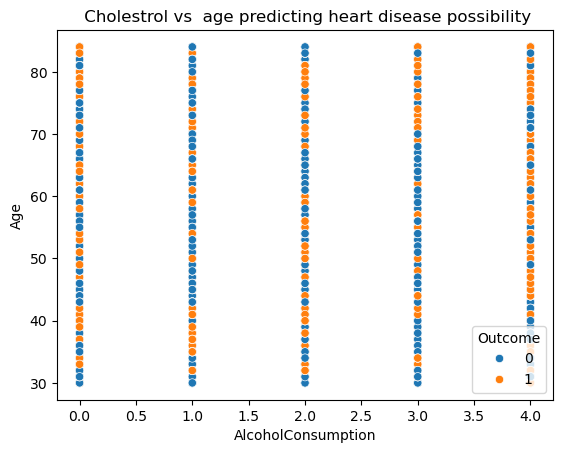

In [68]:
plt.figure()
sns.scatterplot(x='AlcoholConsumption', y='Age', hue='Outcome', data=df)
plt.title(" Cholestrol vs  age predicting heart disease possibility")
plt.show()

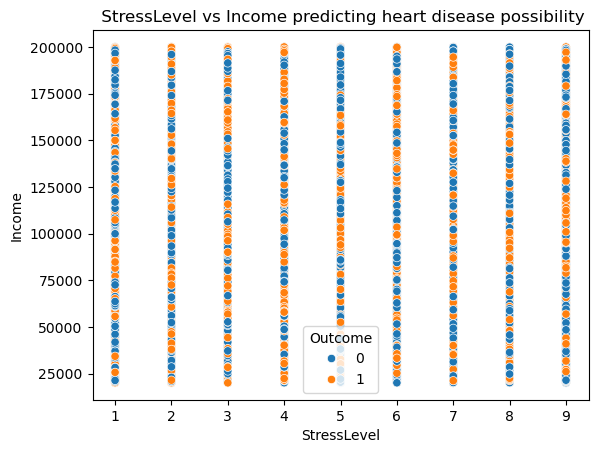

In [76]:
plt.figure()
sns.scatterplot(x='StressLevel', y='Income', hue='Outcome', data=df)
plt.legend(title='Outcome')
plt.title(" StressLevel vs Income predicting heart disease possibility")
plt.show()

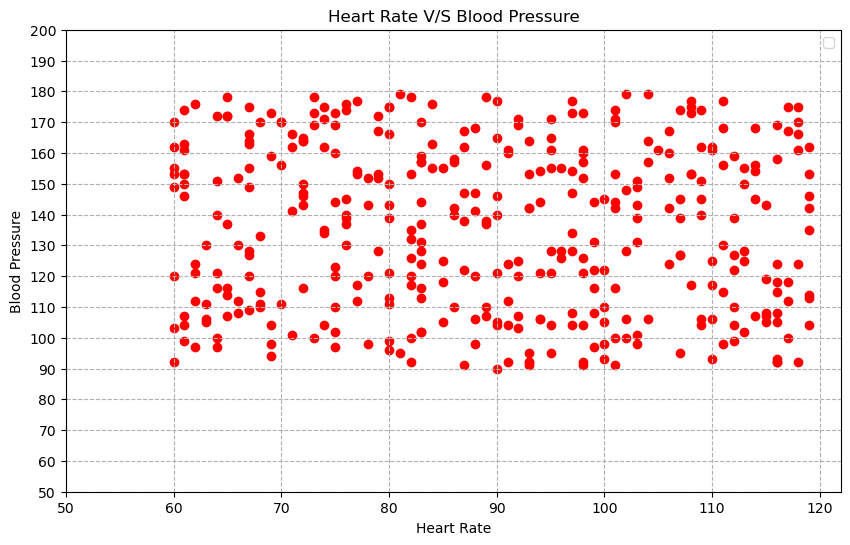

In [122]:
X= df[['HeartRate']].values
y= df['BloodPressure'].values
X_downsampled = X[::1000] 
y_downsampled = y[::1000]
plt.figure(figsize=(10,6))
plt.scatter(X_downsampled,y_downsampled,color='r')
plt.legend()
plt.title("Heart Rate V/S Blood Pressure")
plt.xlabel("Heart Rate")
plt.ylabel("Blood Pressure")
plt.xticks(np.arange(50,130,10))
plt.yticks(np.arange(50,210,10))
plt.grid(linestyle='--')
plt.show()

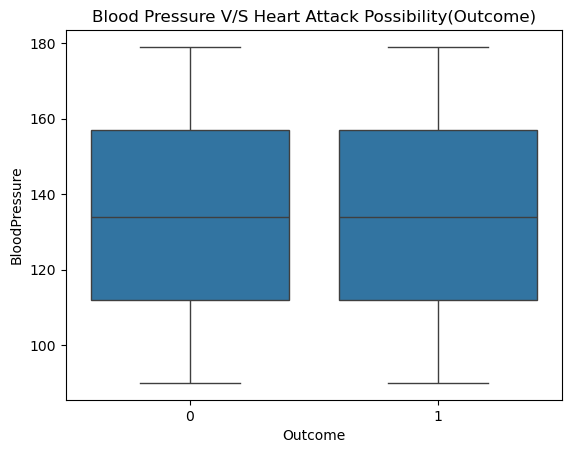

In [199]:
sns.boxplot(x="Outcome", y="BloodPressure", data=df)
plt.title("Blood Pressure V/S Heart Attack Possibility(Outcome)")
plt.show()

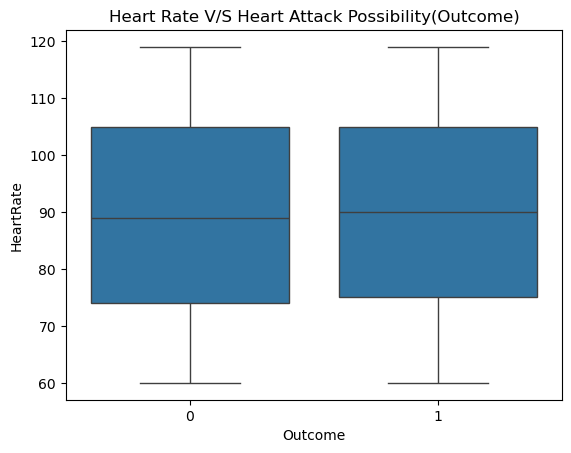

In [211]:
sns.boxplot(x="Outcome", y="HeartRate", data=df)
plt.title("Heart Rate V/S Heart Attack Possibility(Outcome)")
plt.show()

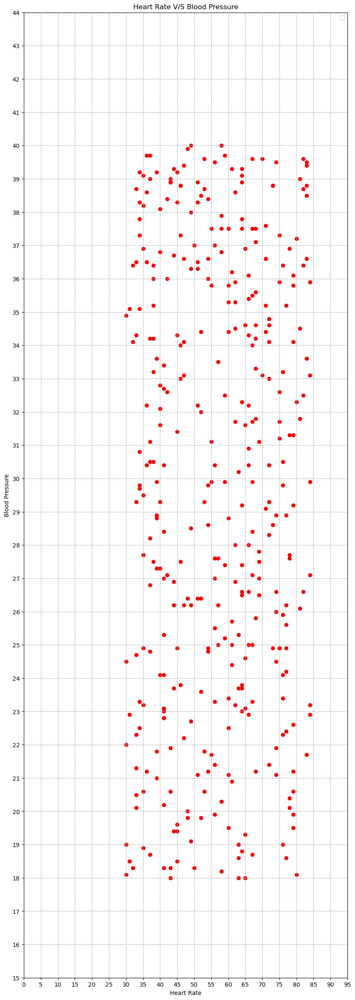

In [195]:
X= df[['Age']].values
y= df['BMI'].values
X_downsampled = X[::1000] 
y_downsampled = y[::1000]
plt.figure(figsize=(10,30))
plt.scatter(X_downsampled,y_downsampled,color='r')
plt.legend()
plt.title("Age V/S BMI")
plt.xlabel("Age")
plt.ylabel("BMI")
plt.xticks(np.arange(0,100,5))
plt.yticks(np.arange(15,45,1))
plt.grid(linestyle='--')
plt.show()

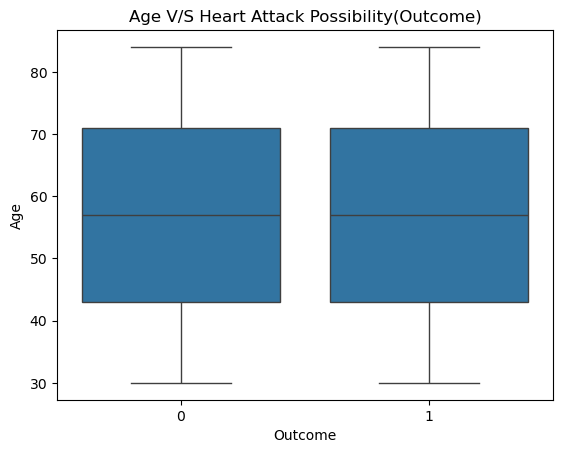

In [209]:
sns.boxplot(x="Outcome", y="Age", data=df)
plt.title("Age V/S Heart Attack Possibility(Outcome)")
plt.show()

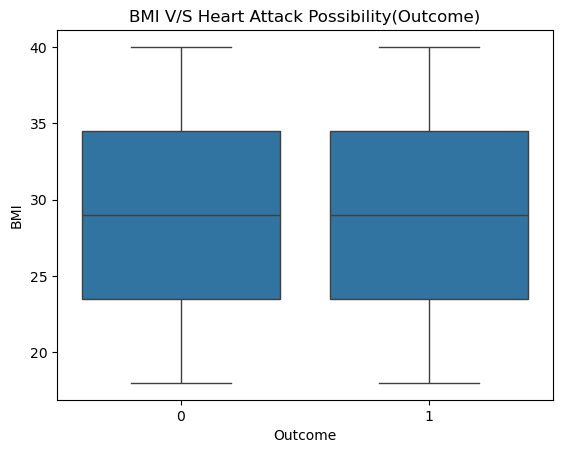

In [207]:
sns.boxplot(x="Outcome", y="BMI", data=df)
plt.title("BMI V/S Heart Attack Possibility(Outcome)")
plt.show()

In [28]:
df=df.drop(['MaritalStatus','EmploymentStatus','Residence','Cholesterol','BloodPressure','Age','HeartRate','BMI','Smoker','Hypertension','FamilyHistory','PhysicalActivity','MaxHeartRate', 'ST_Depression', 'ExerciseInducedAngina','NumberOfMajorVessels'],axis=1)
df

,Gender,Diabetes,AlcoholConsumption,Diet,StressLevel,Ethnicity,Income,EducationLevel,Medication,ChestPainType,ECGResults,Slope,Thalassemia,PreviousHeartAttack,StrokeHistory,Outcome
0,1,1,0,2,1,2,64510,1,1,3,2,0,1,0,0,1
1,1,1,2,2,6,0,91773,0,0,1,0,2,1,0,0,1
2,0,0,3,0,3,1,173550,0,0,2,1,2,1,1,0,0
3,1,1,0,0,3,2,43861,1,1,1,2,1,2,1,0,1
4,0,1,1,1,1,2,83404,1,1,3,2,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
372969,0,1,0,2,2,2,114184,2,0,2,1,1,0,1,0,1
372970,1,1,1,2,4,4,153808,2,0,0,0,0,0,0,1,0
372971,0,1,1,1,4,3,107297,2,0,0,2,1,2,1,1,0
372972,0,1,0,0,6,1,134652,1,0,1,0,2,0,0,0,1


In [30]:
df.columns

Index(['Gender', 'Diabetes', 'AlcoholConsumption', 'Diet', 'StressLevel',
       'Ethnicity', 'Income', 'EducationLevel', 'Medication', 'ChestPainType',
       'ECGResults', 'Slope', 'Thalassemia', 'PreviousHeartAttack',
       'StrokeHistory', 'Outcome'],
      dtype='object')

In [32]:
from sklearn.model_selection import train_test_split
X = df[['Gender', 'Diabetes', 'AlcoholConsumption', 'Diet', 'StressLevel',
       'Ethnicity', 'Income', 'EducationLevel', 'Medication', 'ChestPainType',
       'ECGResults', 'Slope', 'Thalassemia', 'PreviousHeartAttack',
       'StrokeHistory']]
y = df['Outcome']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Data Preprocessing

## Encoding

In [34]:
from sklearn import preprocessing
from sklearn import utils


lab = preprocessing.LabelEncoder()
y_train = lab.fit_transform(y_train)
y_test = lab.transform(y_test)

## Scaling the data

In [36]:
from sklearn.preprocessing import StandardScaler
scaler= StandardScaler()
num_cols=['Income']
scaler.fit(X_train[num_cols])

X_train[num_cols] = scaler.transform(X_train[num_cols])
X_test[num_cols] = scaler.transform(X_test[num_cols])

## Training Models

### Logistic Regression Model

In [40]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

Model Accuracy: 50.42%


### Random Forest Classifier

In [76]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

Model Accuracy: 50.04%


## Decision Tree Classifier

In [80]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy * 100:.2f}%")

Model Accuracy: 49.70%


In [ ]:
##

In [81]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

# Define the hyperparameter grid
param_grid = {
    'max_depth': [3, 5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'criterion': ['gini', 'entropy']
}

# Initialize the model
model = DecisionTreeClassifier(random_state=42)

# Use GridSearchCV to find the best parameters
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)
grid_search.fit(X_train, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Predict using the best model
y_pred = best_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Print best parameters and accuracy
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Optimized Model Accuracy: {accuracy * 100:.2f}%")


Best Parameters: {'criterion': 'entropy', 'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 2}
Optimized Model Accuracy: 49.80%


In [42]:
from catboost import CatBoostClassifier
model = CatBoostClassifier(
    iterations=1000,
    learning_rate=0.05,
    depth=6,
    eval_metric='Accuracy',
    random_seed=42,
    verbose=100,
    early_stopping_rounds=50
)

model.fit(X_train, y_train, eval_set=(X_test, y_test))

y_pred = model.predict(X_test)

print("\n✅ Accuracy Score:", accuracy_score(y_test, y_pred))

0:	learn: 0.5059371	test: 0.4959984	best: 0.4959984 (0)	total: 118ms	remaining: 1m 57s
100:	learn: 0.5325174	test: 0.5019103	best: 0.5024331 (93)	total: 11.5s	remaining: 1m 42s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 0.502433139
bestIteration = 93

Shrink model to first 94 iterations.

✅ Accuracy Score: 0.5024331389503318


## **Conclusion**

#### This project focused on developing and evaluating machine learning models to predict the likelihood of heart attacks based on a variety of health and lifestyle factors. After preprocessing, feature scaling, and strategic hyperparameter tuning, we explored several classification algorithms, including **Logistic Regression**, **Random Forest**, and **CatBoost**. Despite the rigorous approach, the models achieved an accuracy of around **50-51%**, indicating that the current models are still in the early stages of optimization.

#### The results highlight that while the models provide some valuable insights, **further feature engineering**, **data preprocessing**, and **hyperparameter tuning** are crucial steps to enhance their predictive power. Achieving better performance will require more time and computational resources, especially for tasks like **Randomized Search** or **Grid Search** to fine-tune the models to their optimal configurations.

#### Overall, this analysis lays the foundation for **heart attack prediction** and provides an initial understanding of the potential risk factors, but with additional refinement, the models can be significantly improved, leading to more accurate and reliable predictions for early diagnosis and prevention.